# 2_EDA 

### 순서 
1. 관광방문객 
    - 내국인(현지인+외지인),외국인 방문객으로 나눔
    - 외국인 / 내국인 으로 계산
    
    
2. 관광명소
    - 행정구역별 관광명소 / 행정구역별 면적 으로 계산
 
 
3. 관광지출액
    - 외국인/ 내국인으로 계산 (2019.01~2019.12)
    - 1년단위로 더하기 

In [1]:
import pandas as pd
import numpy as np
import folium
from folium.plugins import MarkerCluster
import seaborn as sns
import matplotlib.pyplot as plt
import json

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_rows',10000)
pd.set_option('display.max_columns',10000)

#시각화
import matplotlib.pyplot as plt
import seaborn as sns
import platform

path = "c:/Windows/Fonts/malgun.ttf"
from matplotlib import font_manager, rc
if platform.system() == 'Darwin':
    rc('font', family='AppleGothic')
elif platform.system() == 'Windows':
    font_name = font_manager.FontProperties(fname=path).get_name()
    rc('font', family=font_name)
else:
    print('Unknown system... sorry~~~~')

## 1. 관광방문객

### 데이터 불러오기 

In [2]:
visit=pd.read_csv('관광방문객수.csv',encoding='utf-8')

- 데이터 확인하기 

In [3]:
visit

,Unnamed: 0,코드,touDivNm,touNum,baseYmd,행정구역,시도,군구
0,0,26110,현지인(a),25816.000000,20190101.0,부산광역시 중구,부산광역시,중구
1,1,26110,외지인(b),122283.000000,20190101.0,부산광역시 중구,부산광역시,중구
2,2,26110,외국인(c),3829.133969,20190101.0,부산광역시 중구,부산광역시,중구
3,3,26110,현지인(a),36463.000000,20190102.0,부산광역시 중구,부산광역시,중구
4,4,26110,외지인(b),91987.000000,20190102.0,부산광역시 중구,부산광역시,중구
...,...,...,...,...,...,...,...,...
189327,189327,50130,외지인(b),116042.500000,20191230.0,제주특별자치도 서귀포시,제주특별자치도,서귀포시
189328,189328,50130,외국인(c),7018.336510,20191230.0,제주특별자치도 서귀포시,제주특별자치도,서귀포시
189329,189329,50130,현지인(a),111972.000000,20191231.0,제주특별자치도 서귀포시,제주특별자치도,서귀포시
189330,189330,50130,외지인(b),129395.000000,20191231.0,제주특별자치도 서귀포시,제주특별자치도,서귀포시


In [4]:
visit['행정구역'].unique()

array(['부산광역시 중구', '부산광역시 서구', '부산광역시 동구', '부산광역시 영도구', '부산광역시 부산진구',
       '부산광역시 동래구', '부산광역시 남구', '부산광역시 북구', '부산광역시 해운대구', '부산광역시 사하구',
       '부산광역시 금정구', '부산광역시 강서구', '부산광역시 연제구', '부산광역시 수영구', '부산광역시 사상구',
       '부산광역시 기장군', '대구광역시 중구', '대구광역시 동구', '대구광역시 서구', '대구광역시 남구',
       '대구광역시 북구', '대구광역시 수성구', '대구광역시 달서구', '대구광역시 달성군', '광주광역시 동구',
       '광주광역시 서구', '광주광역시 남구', '광주광역시 북구', '광주광역시 광산구', '대전광역시 동구',
       '대전광역시 중구', '대전광역시 서구', '대전광역시 유성구', '대전광역시 대덕구', '울산광역시 중구',
       '울산광역시 남구', '울산광역시 동구', '울산광역시 북구', '울산광역시 울주군', '세종특별자치시',
       '강원도 춘천시', '강원도 원주시', '강원도 강릉시', '강원도 동해시', '강원도 태백시', '강원도 속초시',
       '강원도 삼척시', '강원도 홍천군', '강원도 횡성군', '강원도 영월군', '강원도 평창군', '강원도 정선군',
       '강원도 철원군', '강원도 화천군', '강원도 양구군', '강원도 인제군', '강원도 고성군', '강원도 양양군',
       '충청북도 청주시 상당구', '충청북도 청주시 서원구', '충청북도 청주시 흥덕구', '충청북도 청주시 청원구',
       '충청북도 충주시', '충청북도 제천시', '충청북도 보은군', '충청북도 옥천군', '충청북도 영동군',
       '충청북도 증평군', '충청북도 진천군', '충청북도 괴산군', '충청북도 음성군', '충청북도 단양군',
       '충청남도 천안시 동남구'

- 불필요한 컬럼 제거

In [5]:
visit=visit.drop('Unnamed: 0',axis=1)
visit

,코드,touDivNm,touNum,baseYmd,행정구역,시도,군구
0,26110,현지인(a),25816.000000,20190101.0,부산광역시 중구,부산광역시,중구
1,26110,외지인(b),122283.000000,20190101.0,부산광역시 중구,부산광역시,중구
2,26110,외국인(c),3829.133969,20190101.0,부산광역시 중구,부산광역시,중구
3,26110,현지인(a),36463.000000,20190102.0,부산광역시 중구,부산광역시,중구
4,26110,외지인(b),91987.000000,20190102.0,부산광역시 중구,부산광역시,중구
...,...,...,...,...,...,...,...
189327,50130,외지인(b),116042.500000,20191230.0,제주특별자치도 서귀포시,제주특별자치도,서귀포시
189328,50130,외국인(c),7018.336510,20191230.0,제주특별자치도 서귀포시,제주특별자치도,서귀포시
189329,50130,현지인(a),111972.000000,20191231.0,제주특별자치도 서귀포시,제주특별자치도,서귀포시
189330,50130,외지인(b),129395.000000,20191231.0,제주특별자치도 서귀포시,제주특별자치도,서귀포시


- 데이터 속성확인

In [6]:
visit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 189332 entries, 0 to 189331
Data columns (total 7 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   코드        189332 non-null  int64  
 1   touDivNm  189332 non-null  object 
 2   touNum    189332 non-null  float64
 3   baseYmd   189332 non-null  float64
 4   행정구역      189332 non-null  object 
 5   시도        189332 non-null  object 
 6   군구        188237 non-null  object 
dtypes: float64(2), int64(1), object(4)
memory usage: 10.1+ MB


### '행정구역' 컬럼 생성하기

- '행정구역' 컬럼 생성

In [7]:
visit['행정구역']=visit['시도']+' '+visit['군구']

- 데이터 속성확인

In [8]:
visit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 189332 entries, 0 to 189331
Data columns (total 7 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   코드        189332 non-null  int64  
 1   touDivNm  189332 non-null  object 
 2   touNum    189332 non-null  float64
 3   baseYmd   189332 non-null  float64
 4   행정구역      188237 non-null  object 
 5   시도        189332 non-null  object 
 6   군구        188237 non-null  object 
dtypes: float64(2), int64(1), object(4)
memory usage: 10.1+ MB


In [9]:
# 군구, 행정구역의 결측치가 세종특별자치시임을 확인
visit[visit['군구'].isna()]

,코드,touDivNm,touNum,baseYmd,행정구역,시도,군구
42705,36110,현지인(a),97741.000000,20190101.0,NaN,세종특별자치시,NaN
42706,36110,외지인(b),59493.000000,20190101.0,NaN,세종특별자치시,NaN
42707,36110,외국인(c),247.860685,20190101.0,NaN,세종특별자치시,NaN
42708,36110,현지인(a),120274.000000,20190102.0,NaN,세종특별자치시,NaN
42709,36110,외지인(b),48244.000000,20190102.0,NaN,세종특별자치시,NaN
42710,36110,외국인(c),224.461899,20190102.0,NaN,세종특별자치시,NaN
42711,36110,현지인(a),120239.000000,20190103.0,NaN,세종특별자치시,NaN
42712,36110,외지인(b),58576.000000,20190103.0,NaN,세종특별자치시,NaN
42713,36110,외국인(c),298.015385,20190103.0,NaN,세종특별자치시,NaN
42714,36110,현지인(a),122643.500000,20190104.0,NaN,세종특별자치시,NaN


In [10]:
alter_index=visit[visit['군구'].isna()].index
for i in alter_index:
    visit.iloc[i,4]='세종특별자치시'
    visit.iloc[i,6]=''

In [11]:
visit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 189332 entries, 0 to 189331
Data columns (total 7 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   코드        189332 non-null  int64  
 1   touDivNm  189332 non-null  object 
 2   touNum    189332 non-null  float64
 3   baseYmd   189332 non-null  float64
 4   행정구역      189332 non-null  object 
 5   시도        189332 non-null  object 
 6   군구        189332 non-null  object 
dtypes: float64(2), int64(1), object(4)
memory usage: 10.1+ MB


- 컬럼 자료형 변환하기 

In [12]:
#'baseYmd'는 20190101로 / 'touNum'는 소숫점 3자리까지만 표시
visit['baseYmd']=visit['baseYmd'].astype('int').astype(str)
visit['touNum']=round(visit['touNum'],3)

- 속성 확인

In [13]:
visit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 189332 entries, 0 to 189331
Data columns (total 7 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   코드        189332 non-null  int64  
 1   touDivNm  189332 non-null  object 
 2   touNum    189332 non-null  float64
 3   baseYmd   189332 non-null  object 
 4   행정구역      189332 non-null  object 
 5   시도        189332 non-null  object 
 6   군구        189332 non-null  object 
dtypes: float64(1), int64(1), object(5)
memory usage: 10.1+ MB


- 데이터 확인

In [14]:
visit.head()

,코드,touDivNm,touNum,baseYmd,행정구역,시도,군구
0,26110,현지인(a),25816.000,20190101,부산광역시 중구,부산광역시,중구
1,26110,외지인(b),122283.000,20190101,부산광역시 중구,부산광역시,중구
2,26110,외국인(c),3829.134,20190101,부산광역시 중구,부산광역시,중구
3,26110,현지인(a),36463.000,20190102,부산광역시 중구,부산광역시,중구
4,26110,외지인(b),91987.000,20190102,부산광역시 중구,부산광역시,중구


In [15]:
visit[visit['시도']=='세종특별자치시']

,코드,touDivNm,touNum,baseYmd,행정구역,시도,군구
42705,36110,현지인(a),97741.000,20190101,세종특별자치시,세종특별자치시,
42706,36110,외지인(b),59493.000,20190101,세종특별자치시,세종특별자치시,
42707,36110,외국인(c),247.861,20190101,세종특별자치시,세종특별자치시,
42708,36110,현지인(a),120274.000,20190102,세종특별자치시,세종특별자치시,
42709,36110,외지인(b),48244.000,20190102,세종특별자치시,세종특별자치시,
42710,36110,외국인(c),224.462,20190102,세종특별자치시,세종특별자치시,
42711,36110,현지인(a),120239.000,20190103,세종특별자치시,세종특별자치시,
42712,36110,외지인(b),58576.000,20190103,세종특별자치시,세종특별자치시,
42713,36110,외국인(c),298.015,20190103,세종특별자치시,세종특별자치시,
42714,36110,현지인(a),122643.500,20190104,세종특별자치시,세종특별자치시,


### 내국인 방문객수 추출

- 내국인 방문객수만 추출

In [16]:
kor_visit=visit[visit.touDivNm!='외국인(c)']
kor_visit.head(730)

,코드,touDivNm,touNum,baseYmd,행정구역,시도,군구
0,26110,현지인(a),25816.0,20190101,부산광역시 중구,부산광역시,중구
1,26110,외지인(b),122283.0,20190101,부산광역시 중구,부산광역시,중구
3,26110,현지인(a),36463.0,20190102,부산광역시 중구,부산광역시,중구
4,26110,외지인(b),91987.0,20190102,부산광역시 중구,부산광역시,중구
6,26110,현지인(a),36617.0,20190103,부산광역시 중구,부산광역시,중구
7,26110,외지인(b),92123.5,20190103,부산광역시 중구,부산광역시,중구
9,26110,현지인(a),36711.5,20190104,부산광역시 중구,부산광역시,중구
10,26110,외지인(b),101447.5,20190104,부산광역시 중구,부산광역시,중구
12,26110,현지인(a),29494.5,20190105,부산광역시 중구,부산광역시,중구
13,26110,외지인(b),129885.0,20190105,부산광역시 중구,부산광역시,중구


- 행정구역을 기준으로 방문객수의 합 구하기

In [17]:
kor_visit=kor_visit.groupby('행정구역')['touNum'].sum()
kor_visit

행정구역
강원도 강릉시            83168288.0
강원도 고성군            16176279.0
강원도 동해시            30679134.5
강원도 삼척시            25404414.0
강원도 속초시            41289409.0
강원도 양구군             8150733.5
강원도 양양군            21033015.5
강원도 영월군            11505977.0
강원도 원주시            98915099.5
강원도 인제군            15416191.0
강원도 정선군            16396940.0
강원도 철원군            13993126.0
강원도 춘천시            91097083.0
강원도 태백시            16766029.0
강원도 평창군            22259576.5
강원도 홍천군            25949367.5
강원도 화천군             9259180.0
강원도 횡성군            20444924.5
경상남도 거제시           97241070.5
경상남도 거창군           17328346.0
경상남도 고성군           16752564.5
경상남도 김해시          123643096.5
경상남도 남해군           15065253.0
경상남도 밀양시           30247962.5
경상남도 사천시           34797812.0
경상남도 산청군           10976213.5
경상남도 양산시           90450479.0
경상남도 의령군            8429963.5
경상남도 진주시           83567799.0
경상남도 창녕군           19164519.5
경상남도 창원시 마산합포구     58111812.5
경상남도 창원시 마산회원구     52670404.5
경상남도 창원시 성산구       74363565.5
경상남도 

- 시리즈를 데이터프레임형태로 변환

In [18]:
kor_visit=pd.DataFrame(kor_visit,index=kor_visit.index)
kor_visit=kor_visit.reset_index()
kor_visit

,행정구역,touNum
0,강원도 강릉시,83168288.0
1,강원도 고성군,16176279.0
2,강원도 동해시,30679134.5
3,강원도 삼척시,25404414.0
4,강원도 속초시,41289409.0
5,강원도 양구군,8150733.5
6,강원도 양양군,21033015.5
7,강원도 영월군,11505977.0
8,강원도 원주시,98915099.5
9,강원도 인제군,15416191.0


- 컬럼명 변경

In [19]:
# 'touNum'를'내국인방문객수'로 변경
kor_visit=kor_visit.rename(columns={'touNum':'내국인방문객수'})
kor_visit

,행정구역,내국인방문객수
0,강원도 강릉시,83168288.0
1,강원도 고성군,16176279.0
2,강원도 동해시,30679134.5
3,강원도 삼척시,25404414.0
4,강원도 속초시,41289409.0
5,강원도 양구군,8150733.5
6,강원도 양양군,21033015.5
7,강원도 영월군,11505977.0
8,강원도 원주시,98915099.5
9,강원도 인제군,15416191.0


### 외국인 방문객수만 추출

- 외국인 방문객수만 추출

In [20]:
for_visit=visit[visit.touDivNm=='외국인(c)']
for_visit.head(730)

,코드,touDivNm,touNum,baseYmd,행정구역,시도,군구
2,26110,외국인(c),3829.134,20190101,부산광역시 중구,부산광역시,중구
5,26110,외국인(c),4648.195,20190102,부산광역시 중구,부산광역시,중구
8,26110,외국인(c),3399.412,20190103,부산광역시 중구,부산광역시,중구
11,26110,외국인(c),3140.076,20190104,부산광역시 중구,부산광역시,중구
14,26110,외국인(c),2508.760,20190105,부산광역시 중구,부산광역시,중구
17,26110,외국인(c),1944.735,20190106,부산광역시 중구,부산광역시,중구
20,26110,외국인(c),1560.750,20190107,부산광역시 중구,부산광역시,중구
23,26110,외국인(c),2090.182,20190108,부산광역시 중구,부산광역시,중구
26,26110,외국인(c),1577.448,20190109,부산광역시 중구,부산광역시,중구
29,26110,외국인(c),1253.718,20190110,부산광역시 중구,부산광역시,중구


- 행정구역을 기준으로 방문객수의 합 구하기

In [21]:
for_visit=for_visit.groupby('행정구역')['touNum'].sum()
for_visit

행정구역
강원도 강릉시            161140.623
강원도 고성군            109856.577
강원도 동해시             93348.489
강원도 삼척시             67443.327
강원도 속초시            258692.228
강원도 양구군             11293.869
강원도 양양군             51820.080
강원도 영월군             22381.094
강원도 원주시            142118.038
강원도 인제군             29348.329
강원도 정선군             50090.172
강원도 철원군             16605.205
강원도 춘천시            729575.436
강원도 태백시             11570.250
강원도 평창군            241967.123
강원도 홍천군            147835.062
강원도 화천군             26436.660
강원도 횡성군             54244.544
경상남도 거제시           429560.592
경상남도 거창군            16445.771
경상남도 고성군            36414.808
경상남도 김해시           238405.078
경상남도 남해군           423261.053
경상남도 밀양시            51394.512
경상남도 사천시            64331.964
경상남도 산청군            14932.085
경상남도 양산시           131608.271
경상남도 의령군             8967.762
경상남도 진주시            96464.172
경상남도 창녕군            50476.962
경상남도 창원시 마산합포구      84047.371
경상남도 창원시 마산회원구      45680.503
경상남도 창원시 성산구       202107.086
경상남도 

- 시리즈를 데이터프레임형태로 변환

In [22]:
for_visit=pd.DataFrame(for_visit,index=for_visit.index)
for_visit=for_visit.reset_index()
for_visit

,행정구역,touNum
0,강원도 강릉시,161140.623
1,강원도 고성군,109856.577
2,강원도 동해시,93348.489
3,강원도 삼척시,67443.327
4,강원도 속초시,258692.228
5,강원도 양구군,11293.869
6,강원도 양양군,51820.080
7,강원도 영월군,22381.094
8,강원도 원주시,142118.038
9,강원도 인제군,29348.329


- 컬럼명 변경

In [23]:
# 'touNum'를'외국인방문객수'로 변경
for_visit=for_visit.rename(columns={'touNum':'외국인방문객수'})
for_visit

,행정구역,외국인방문객수
0,강원도 강릉시,161140.623
1,강원도 고성군,109856.577
2,강원도 동해시,93348.489
3,강원도 삼척시,67443.327
4,강원도 속초시,258692.228
5,강원도 양구군,11293.869
6,강원도 양양군,51820.080
7,강원도 영월군,22381.094
8,강원도 원주시,142118.038
9,강원도 인제군,29348.329


### 데이터 합치기

- 내국인 방문객수와 외국인 방문객수 데이터 병합하기

In [24]:
#'행정구역'컬럼을 기준으로 데이터 병합
total_visit=pd.merge(kor_visit,for_visit,how='right',on='행정구역')
total_visit

,행정구역,내국인방문객수,외국인방문객수
0,강원도 강릉시,83168288.0,161140.623
1,강원도 고성군,16176279.0,109856.577
2,강원도 동해시,30679134.5,93348.489
3,강원도 삼척시,25404414.0,67443.327
4,강원도 속초시,41289409.0,258692.228
5,강원도 양구군,8150733.5,11293.869
6,강원도 양양군,21033015.5,51820.080
7,강원도 영월군,11505977.0,22381.094
8,강원도 원주시,98915099.5,142118.038
9,강원도 인제군,15416191.0,29348.329


### 외국인 방문객수/내국인 방문객수 컬럼 생성

- 외국인/내국인으로 계산

In [25]:
total_visit['외국인/내국인']=total_visit['외국인방문객수']/total_visit['내국인방문객수']

- 데이터 확인

In [26]:
total_visit

,행정구역,내국인방문객수,외국인방문객수,외국인/내국인
0,강원도 강릉시,83168288.0,161140.623,0.001938
1,강원도 고성군,16176279.0,109856.577,0.006791
2,강원도 동해시,30679134.5,93348.489,0.003043
3,강원도 삼척시,25404414.0,67443.327,0.002655
4,강원도 속초시,41289409.0,258692.228,0.006265
5,강원도 양구군,8150733.5,11293.869,0.001386
6,강원도 양양군,21033015.5,51820.080,0.002464
7,강원도 영월군,11505977.0,22381.094,0.001945
8,강원도 원주시,98915099.5,142118.038,0.001437
9,강원도 인제군,15416191.0,29348.329,0.001904


### 데이터 정렬하기

- 데이터 정렬

In [27]:
# '외국인/내국인'컬럼 기준으로 데이터 정렬하기
sort_total_visit=total_visit.sort_values('외국인/내국인')
sort_total_visit

,행정구역,내국인방문객수,외국인방문객수,외국인/내국인
65,광주광역시 남구,55231596.0,36457.711,0.000660
13,강원도 태백시,16766029.0,11570.250,0.000690
67,광주광역시 북구,128785342.0,94970.214,0.000737
81,대전광역시 중구,88174184.0,65054.549,0.000738
143,충청남도 계룡시,12546334.5,9335.280,0.000744
103,울산광역시 중구,64128032.5,48612.879,0.000758
125,전라남도 화순군,23600587.5,18433.880,0.000781
168,충청북도 청주시 상당구,59411250.5,47426.857,0.000798
89,부산광역시 북구,64501279.5,52108.987,0.000808
156,충청남도 청양군,9805187.0,8214.588,0.000838


- 인덱스 재설정하기

In [28]:
sort_total_visit=sort_total_visit.reset_index(drop=True)
sort_total_visit

,행정구역,내국인방문객수,외국인방문객수,외국인/내국인
0,광주광역시 남구,55231596.0,36457.711,0.000660
1,강원도 태백시,16766029.0,11570.250,0.000690
2,광주광역시 북구,128785342.0,94970.214,0.000737
3,대전광역시 중구,88174184.0,65054.549,0.000738
4,충청남도 계룡시,12546334.5,9335.280,0.000744
5,울산광역시 중구,64128032.5,48612.879,0.000758
6,전라남도 화순군,23600587.5,18433.880,0.000781
7,충청북도 청주시 상당구,59411250.5,47426.857,0.000798
8,부산광역시 북구,64501279.5,52108.987,0.000808
9,충청남도 청양군,9805187.0,8214.588,0.000838


In [29]:
sort_total_visit[sort_total_visit['행정구역']=='전라북도 고창군']

,행정구역,내국인방문객수,외국인방문객수,외국인/내국인
86,전라북도 고창군,19260223.5,36080.333,0.001873


### 데이터 시각화

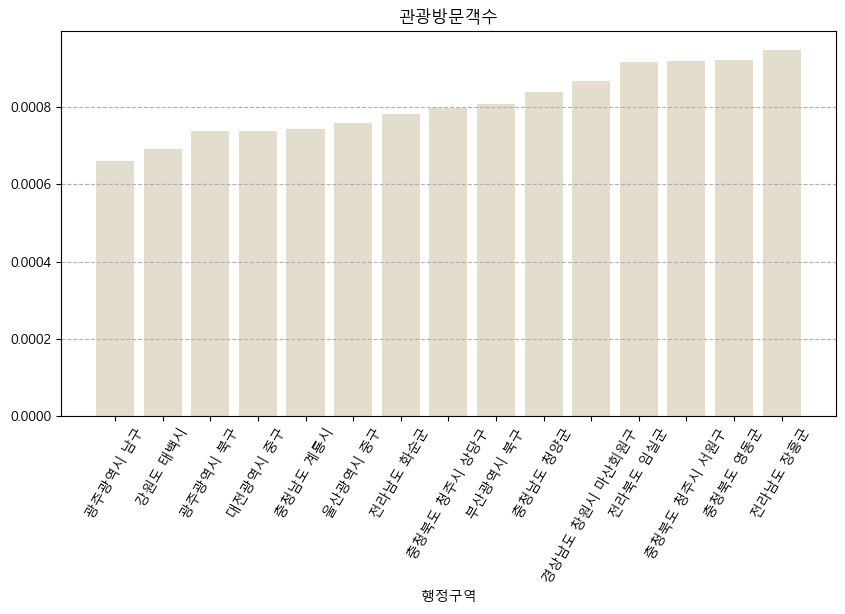

In [30]:
plt.figure(figsize=(10,5))
plt.bar(x=sort_total_visit.iloc[:15,0],height=sort_total_visit.iloc[:15,3],color='#E3DDCE')
plt.xlabel('행정구역')
plt.title('관광방문객수')
plt.grid(axis='y',linestyle='--')
plt.xticks(rotation=60)
plt.show()


---

## 2. 관광명소

### 데이터 불러오기

In [31]:
place=pd.read_csv('전국관광명소.csv')
area=pd.read_csv('면적추출.csv')

- 불필요한 컬럼 삭제

In [32]:
place=place.drop('Unnamed: 0',axis=1)
place

,관광명소,시군구
0,서울풍물시장전통문화체험관,서울특별시 동대문구
1,양재시민의숲,서울특별시 서초구
2,봉화산(서울),서울특별시 중랑구
3,파리공원,서울특별시 양천구
4,한강시민공원 망원지구(망원한강공원),서울특별시 마포구
5,한강시민공원여의도지구(여의도한강공원),서울특별시 영등포구
6,한강시민공원뚝섬지구(뚝섬한강공원),서울특별시 광진구
7,서래마을,서울특별시 서초구
8,이태원 앤틱 가구 거리,서울특별시 용산구
9,와룡공원,서울특별시 종로구


- 컬럼 이름 변경

In [33]:
place=place.rename(columns={'시군구':'행정구역'})
place

,관광명소,행정구역
0,서울풍물시장전통문화체험관,서울특별시 동대문구
1,양재시민의숲,서울특별시 서초구
2,봉화산(서울),서울특별시 중랑구
3,파리공원,서울특별시 양천구
4,한강시민공원 망원지구(망원한강공원),서울특별시 마포구
5,한강시민공원여의도지구(여의도한강공원),서울특별시 영등포구
6,한강시민공원뚝섬지구(뚝섬한강공원),서울특별시 광진구
7,서래마을,서울특별시 서초구
8,이태원 앤틱 가구 거리,서울특별시 용산구
9,와룡공원,서울특별시 종로구


In [34]:
alter_index=place[place['행정구역']=='세종특별자치시 세종특별자치시'].index
alter_index

Int64Index([394, 395, 396, 397, 398, 399, 400, 401, 402], dtype='int64')

In [35]:
for i in alter_index:
    place.iloc[i,1]='세종특별자치시'

In [36]:
place

,관광명소,행정구역
0,서울풍물시장전통문화체험관,서울특별시 동대문구
1,양재시민의숲,서울특별시 서초구
2,봉화산(서울),서울특별시 중랑구
3,파리공원,서울특별시 양천구
4,한강시민공원 망원지구(망원한강공원),서울특별시 마포구
5,한강시민공원여의도지구(여의도한강공원),서울특별시 영등포구
6,한강시민공원뚝섬지구(뚝섬한강공원),서울특별시 광진구
7,서래마을,서울특별시 서초구
8,이태원 앤틱 가구 거리,서울특별시 용산구
9,와룡공원,서울특별시 종로구


### 행정구역별 관광명소 개수 구하기

- '행정구역' 기준으로 개수 구하기

In [37]:
# '행정구역'기준으로 그룹화 후 count()사용
place=place.groupby('행정구역').count()
place

,관광명소
행정구역,
강원도 강릉시,38
강원도 고성군,23
강원도 동해시,11
강원도 삼척시,18
강원도 속초시,13
강원도 양구군,12
강원도 양양군,15
강원도 영월군,22
강원도 원주시,19


- 인덱스 재설정

In [38]:
place=place.reset_index()
place

,행정구역,관광명소
0,강원도 강릉시,38
1,강원도 고성군,23
2,강원도 동해시,11
3,강원도 삼척시,18
4,강원도 속초시,13
5,강원도 양구군,12
6,강원도 양양군,15
7,강원도 영월군,22
8,강원도 원주시,19
9,강원도 인제군,12


### 면적데이터 확인

In [39]:
area

,Unnamed: 0,도,시/군/구,면적
0,0,충청북도,괴산군,8.421890e+08
1,1,충청북도,단양군,7.801587e+08
2,2,충청북도,보은군,5.842075e+08
3,3,충청북도,영동군,8.460162e+08
4,4,충청북도,옥천군,5.372212e+08
5,5,충청북도,음성군,5.201822e+08
6,6,충청북도,제천시,8.834221e+08
7,7,충청북도,증평군,8.179765e+07
8,8,충청북도,진천군,4.073033e+08
9,9,충청북도,청주시 상당구,4.043621e+08


- 불필요한 컬럼 삭제

In [40]:
area=area.drop('Unnamed: 0',axis=1)
area

,도,시/군/구,면적
0,충청북도,괴산군,8.421890e+08
1,충청북도,단양군,7.801587e+08
2,충청북도,보은군,5.842075e+08
3,충청북도,영동군,8.460162e+08
4,충청북도,옥천군,5.372212e+08
5,충청북도,음성군,5.201822e+08
6,충청북도,제천시,8.834221e+08
7,충청북도,증평군,8.179765e+07
8,충청북도,진천군,4.073033e+08
9,충청북도,청주시 상당구,4.043621e+08


- '행정구역' 컬럼 추가

In [41]:
area['행정구역']=area['도']+' '+area['시/군/구']
area

,도,시/군/구,면적,행정구역
0,충청북도,괴산군,8.421890e+08,충청북도 괴산군
1,충청북도,단양군,7.801587e+08,충청북도 단양군
2,충청북도,보은군,5.842075e+08,충청북도 보은군
3,충청북도,영동군,8.460162e+08,충청북도 영동군
4,충청북도,옥천군,5.372212e+08,충청북도 옥천군
5,충청북도,음성군,5.201822e+08,충청북도 음성군
6,충청북도,제천시,8.834221e+08,충청북도 제천시
7,충청북도,증평군,8.179765e+07,충청북도 증평군
8,충청북도,진천군,4.073033e+08,충청북도 진천군
9,충청북도,청주시 상당구,4.043621e+08,충청북도 청주시 상당구


In [42]:
area[area['행정구역']=='세종특별자치시 세종특별자치시']

,도,시/군/구,면적,행정구역
84,세종특별자치시,세종특별자치시,464949680.2,세종특별자치시 세종특별자치시


In [43]:
area.iloc[area[area['행정구역']=='세종특별자치시 세종특별자치시'].index,3]='세종특별자치시'

In [44]:
area

,도,시/군/구,면적,행정구역
0,충청북도,괴산군,8.421890e+08,충청북도 괴산군
1,충청북도,단양군,7.801587e+08,충청북도 단양군
2,충청북도,보은군,5.842075e+08,충청북도 보은군
3,충청북도,영동군,8.460162e+08,충청북도 영동군
4,충청북도,옥천군,5.372212e+08,충청북도 옥천군
5,충청북도,음성군,5.201822e+08,충청북도 음성군
6,충청북도,제천시,8.834221e+08,충청북도 제천시
7,충청북도,증평군,8.179765e+07,충청북도 증평군
8,충청북도,진천군,4.073033e+08,충청북도 진천군
9,충청북도,청주시 상당구,4.043621e+08,충청북도 청주시 상당구


### 데이터 병합

- 행정구역별 관광명소 개수와 행정구역별 면적 데이터프레임을 병합

In [45]:
total_place=pd.merge(place,area,how='right',on='행정구역')
total_place

,행정구역,관광명소,도,시/군/구,면적
0,충청북도 괴산군,7.0,충청북도,괴산군,8.421890e+08
1,충청북도 단양군,10.0,충청북도,단양군,7.801587e+08
2,충청북도 보은군,4.0,충청북도,보은군,5.842075e+08
3,충청북도 영동군,4.0,충청북도,영동군,8.460162e+08
4,충청북도 옥천군,4.0,충청북도,옥천군,5.372212e+08
5,충청북도 음성군,7.0,충청북도,음성군,5.201822e+08
6,충청북도 제천시,15.0,충청북도,제천시,8.834221e+08
7,충청북도 증평군,4.0,충청북도,증평군,8.179765e+07
8,충청북도 진천군,7.0,충청북도,진천군,4.073033e+08
9,충청북도 청주시 상당구,9.0,충청북도,청주시 상당구,4.043621e+08


### 결측치 확인

- '관광명소'컬럼이 결측치인 행 추출

In [46]:
total_place[total_place['관광명소'].isna()]

,행정구역,관광명소,도,시/군/구,면적
70,인천광역시 계양구,NaN,인천광역시,계양구,45565180.1
122,부산광역시 연제구,NaN,부산광역시,연제구,12098902.6
181,경상남도 창원시 마산회원구,NaN,경상남도,창원시 마산회원구,90585435.3
206,경기도 수원시 권선구,NaN,경기도,수원시 권선구,47170329.7


- 결측치를 0으로 채움

In [47]:
total_place[total_place['관광명소'].isna()]=total_place[total_place['관광명소'].isna()].fillna(0)

- 결측치 확인

In [48]:
total_place[total_place['관광명소'].isna()]

,행정구역,관광명소,도,시/군/구,면적


### 면적당 관광명소 개수 컬럼 추가

- 관광명소개수 / 면적

In [49]:
total_place['관광명소/면적']=total_place['관광명소']/total_place['면적']
total_place

,행정구역,관광명소,도,시/군/구,면적,관광명소/면적
0,충청북도 괴산군,7.0,충청북도,괴산군,8.421890e+08,8.311673e-09
1,충청북도 단양군,10.0,충청북도,단양군,7.801587e+08,1.281791e-08
2,충청북도 보은군,4.0,충청북도,보은군,5.842075e+08,6.846882e-09
3,충청북도 영동군,4.0,충청북도,영동군,8.460162e+08,4.728042e-09
4,충청북도 옥천군,4.0,충청북도,옥천군,5.372212e+08,7.445723e-09
5,충청북도 음성군,7.0,충청북도,음성군,5.201822e+08,1.345682e-08
6,충청북도 제천시,15.0,충청북도,제천시,8.834221e+08,1.697943e-08
7,충청북도 증평군,4.0,충청북도,증평군,8.179765e+07,4.890116e-08
8,충청북도 진천군,7.0,충청북도,진천군,4.073033e+08,1.718621e-08
9,충청북도 청주시 상당구,9.0,충청북도,청주시 상당구,4.043621e+08,2.225728e-08


### 수도권 데이터 삭제


- '도'컬럼이 '서울특별시'인 행 확인

In [50]:
del_index1=total_place[(total_place['도']=='서울특별시')]
del_index1

,행정구역,관광명소,도,시/군/구,면적,관광명소/면적
85,서울특별시 강남구,6.0,서울특별시,강남구,39501012.7,1.518948e-07
86,서울특별시 강동구,6.0,서울특별시,강동구,24590255.5,2.439991e-07
87,서울특별시 강북구,5.0,서울특별시,강북구,23600101.7,2.118635e-07
88,서울특별시 강서구,4.0,서울특별시,강서구,41436853.4,9.653243e-08
89,서울특별시 관악구,5.0,서울특별시,관악구,29568928.8,1.690964e-07
90,서울특별시 광진구,5.0,서울특별시,광진구,17062948.5,2.930326e-07
91,서울특별시 구로구,6.0,서울특별시,구로구,20120106.3,2.982092e-07
92,서울특별시 금천구,1.0,서울특별시,금천구,13020260.2,7.680338e-08
93,서울특별시 노원구,5.0,서울특별시,노원구,35437537.9,1.410933e-07
94,서울특별시 도봉구,1.0,서울특별시,도봉구,20660964.6,4.840045e-08


- '도'컬럼이 '인천광역시'인 행 확인

In [51]:
del_index2=total_place[(total_place['도']=='인천광역시')]
del_index2

,행정구역,관광명소,도,시/군/구,면적,관광명소/면적
69,인천광역시 강화군,36.0,인천광역시,강화군,411411035.0,8.750373e-08
70,인천광역시 계양구,0.0,인천광역시,계양구,45565180.1,0.000000e+00
71,인천광역시 남동구,5.0,인천광역시,남동구,57016643.6,8.769369e-08
72,인천광역시 동구,3.0,인천광역시,동구,7194830.7,4.169660e-07
73,인천광역시 미추홀구,1.0,인천광역시,미추홀구,24835030.0,4.026571e-08
74,인천광역시 부평구,3.0,인천광역시,부평구,32008762.1,9.372434e-08
75,인천광역시 서구,2.0,인천광역시,서구,117087390.4,1.708126e-08
76,인천광역시 연수구,3.0,인천광역시,연수구,54947865.8,5.459721e-08
77,인천광역시 옹진군,21.0,인천광역시,옹진군,172904213.9,1.214545e-07
78,인천광역시 중구,9.0,인천광역시,중구,140286899.5,6.415424e-08


- '도'컬럼이 '경기도'인 행 확인

In [52]:
del_index3=total_place[(total_place['도']=='경기도')]
del_index3

,행정구역,관광명소,도,시/군/구,면적,관광명소/면적
190,경기도 가평군,18.0,경기도,가평군,843690574.7,2.133484e-08
191,경기도 고양시 덕양구,12.0,경기도,고양시 덕양구,165574887.1,7.247476e-08
192,경기도 고양시 일산동구,4.0,경기도,고양시 일산동구,59952693.1,6.671927e-08
193,경기도 고양시 일산서구,3.0,경기도,고양시 일산서구,42560750.2,7.048748e-08
194,경기도 과천시,4.0,경기도,과천시,35868319.2,1.115190e-07
195,경기도 광명시,4.0,경기도,광명시,38526427.7,1.038248e-07
196,경기도 광주시,13.0,경기도,광주시,430990347.1,3.016309e-08
197,경기도 구리시,4.0,경기도,구리시,33325063.8,1.200298e-07
198,경기도 군포시,3.0,경기도,군포시,36416853.9,8.237944e-08
199,경기도 김포시,36.0,경기도,김포시,276612088.4,1.301462e-07


- '도'컬럼이 '서울특별시', '인천광역시','경기도'인 행의 인덱스 추출

In [53]:
del_index=[]
for i in range(len(total_place)):
    if(total_place.iloc[i,2]=='서울특별시')or(total_place.iloc[i,2]=='인천광역시')or(total_place.iloc[i,2]=='경기도'):
        del_index.append(i)

- 해당 인덱스 삭제

In [54]:
total_place=total_place.drop(del_index,axis=0)
total_place

,행정구역,관광명소,도,시/군/구,면적,관광명소/면적
0,충청북도 괴산군,7.0,충청북도,괴산군,8.421890e+08,8.311673e-09
1,충청북도 단양군,10.0,충청북도,단양군,7.801587e+08,1.281791e-08
2,충청북도 보은군,4.0,충청북도,보은군,5.842075e+08,6.846882e-09
3,충청북도 영동군,4.0,충청북도,영동군,8.460162e+08,4.728042e-09
4,충청북도 옥천군,4.0,충청북도,옥천군,5.372212e+08,7.445723e-09
5,충청북도 음성군,7.0,충청북도,음성군,5.201822e+08,1.345682e-08
6,충청북도 제천시,15.0,충청북도,제천시,8.834221e+08,1.697943e-08
7,충청북도 증평군,4.0,충청북도,증평군,8.179765e+07,4.890116e-08
8,충청북도 진천군,7.0,충청북도,진천군,4.073033e+08,1.718621e-08
9,충청북도 청주시 상당구,9.0,충청북도,청주시 상당구,4.043621e+08,2.225728e-08


### 데이터 정렬하기

- '관광명소/면적'컬럼을 기준으로 데이터 정렬하기

In [55]:
sort_total_place=total_place.sort_values('관광명소/면적',ascending=False)
sort_total_place

,행정구역,관광명소,도,시/군/구,면적,관광명소/면적
124,부산광역시 중구,6.0,부산광역시,중구,2.825782e+06,2.123306e-06
138,대구광역시 중구,10.0,대구광역시,중구,7.055184e+06,1.417397e-06
114,부산광역시 동구,5.0,부산광역시,동구,9.865235e+06,5.068303e-07
123,부산광역시 영도구,6.0,부산광역시,영도구,1.419960e+07,4.225473e-07
131,대구광역시 남구,7.0,대구광역시,남구,1.743153e+07,4.015711e-07
121,부산광역시 수영구,3.0,부산광역시,수영구,1.021243e+07,2.937597e-07
160,경상북도 울릉군,16.0,경상북도,울릉군,7.294220e+07,2.193518e-07
120,부산광역시 서구,3.0,부산광역시,서구,1.397961e+07,2.145982e-07
54,전라남도 목포시,11.0,전라남도,목포시,5.162081e+07,2.130924e-07
80,울산광역시 동구,7.0,울산광역시,동구,3.607469e+07,1.940419e-07


- 인덱스 재설정

In [56]:
sort_total_place=sort_total_place.reset_index(drop=True)
sort_total_place

,행정구역,관광명소,도,시/군/구,면적,관광명소/면적
0,부산광역시 중구,6.0,부산광역시,중구,2.825782e+06,2.123306e-06
1,대구광역시 중구,10.0,대구광역시,중구,7.055184e+06,1.417397e-06
2,부산광역시 동구,5.0,부산광역시,동구,9.865235e+06,5.068303e-07
3,부산광역시 영도구,6.0,부산광역시,영도구,1.419960e+07,4.225473e-07
4,대구광역시 남구,7.0,대구광역시,남구,1.743153e+07,4.015711e-07
5,부산광역시 수영구,3.0,부산광역시,수영구,1.021243e+07,2.937597e-07
6,경상북도 울릉군,16.0,경상북도,울릉군,7.294220e+07,2.193518e-07
7,부산광역시 서구,3.0,부산광역시,서구,1.397961e+07,2.145982e-07
8,전라남도 목포시,11.0,전라남도,목포시,5.162081e+07,2.130924e-07
9,울산광역시 동구,7.0,울산광역시,동구,3.607469e+07,1.940419e-07


### 데이터 시각화

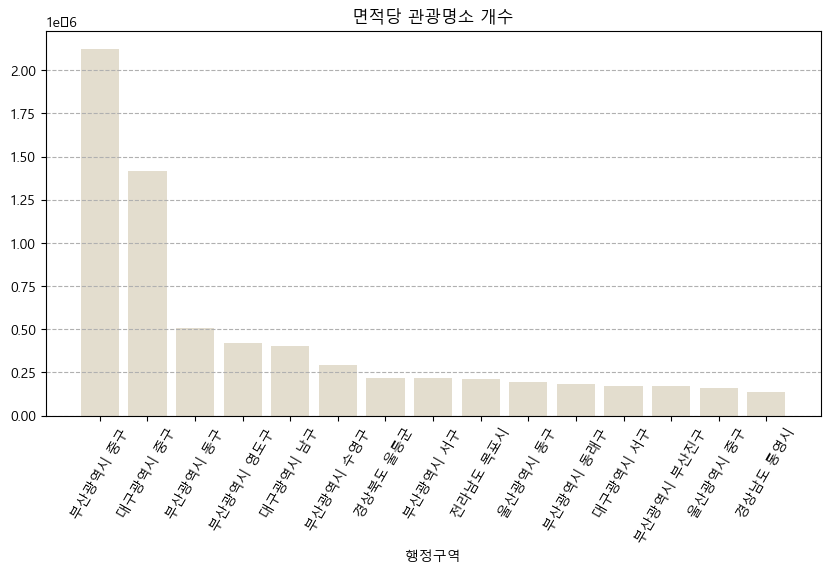

In [57]:
plt.figure(figsize=(10,5))
plt.bar(x=sort_total_place.iloc[:15,0],height=sort_total_place.iloc[:15,5],color='#E3DDCE')
plt.xlabel('행정구역')
plt.title('면적당 관광명소 개수')
plt.grid(axis='y',linestyle='--')
plt.xticks(rotation=60)
plt.show()

---

## 3. 관광지출액

### 데이터 불러오기

- 데이터 불러오기 및 확인

In [58]:
kor_money=pd.read_excel('시군구별 내국인지출액.xlsx')
kor_money.head()

,시도,군구,2019-01-01 00:00:00,2019-02-01 00:00:00,2019-03-01 00:00:00,2019-04-01 00:00:00,2019-05-01 00:00:00,2019-06-01 00:00:00,2019-07-01 00:00:00,2019-08-01 00:00:00,2019-09-01 00:00:00,2019-10-01 00:00:00,2019-11-01 00:00:00,2019-12-01 00:00:00
0,부산광역시,강서구,14968197,12627758,13777553,13582921,13939468,13484007,14104886,12830983,11208840,13555196,14892640,15360907
1,부산광역시,남구,9889843,9459178,11009805,10077976,10990135,10278977,9731839,10216470,10185754,10076038,9856746,10354626
2,부산광역시,부산진구,40903224,39354870,41668979,97560063,41348728,38610097,39141025,40959064,38060010,38474566,39333813,12856162
3,부산광역시,사하구,8126483,7876460,9062477,8390944,9359266,8395746,8334123,8457083,8243837,8531513,8013942,8295753
4,부산광역시,연제구,13571823,12500272,14468018,12582859,13976347,13216724,13368835,13571609,12698305,12351403,12492670,14027025


- 데이터 불러오기 및 확인

In [59]:
for_money=pd.read_excel('시군구별 외국인지출액.xlsx')
for_money.head()

,시도,군구,2019-01-01 00:00:00,2019-02-01 00:00:00,2019-03-01 00:00:00,2019-04-01 00:00:00,2019-05-01 00:00:00,2019-06-01 00:00:00,2019-07-01 00:00:00,2019-08-01 00:00:00,2019-09-01 00:00:00,2019-10-01 00:00:00,2019-11-01 00:00:00,2019-12-01 00:00:00
0,부산광역시,강서구,940885,924361,994595,1216380,1231425,1219518,1111216,1215921,1125404,1252328,1154574,1056918
1,부산광역시,남구,93185,97878,123549,154812,156903,135809,170568,158190,187553,236191,192628,228362
2,부산광역시,부산진구,11833778,10157034,12663737,13963090,13449433,12944256,11760085,13089424,11365388,11522266,12172754,15519199
3,부산광역시,사하구,72944,55188,70336,105077,111806,120516,101421,101867,101111,133314,100876,96751
4,부산광역시,연제구,56403,43941,73346,75855,72170,74504,81664,78907,58151,65076,62411,69323


### 내국인지출액 대비 외국인 지출액 확인하기 

- 외국인 지출액 / 내국인 지출액 계산

In [60]:
part_money=for_money.iloc[:,2:]/kor_money.iloc[:,2:]
part_money

,2019-01-01 00:00:00,2019-02-01 00:00:00,2019-03-01 00:00:00,2019-04-01 00:00:00,2019-05-01 00:00:00,2019-06-01 00:00:00,2019-07-01 00:00:00,2019-08-01 00:00:00,2019-09-01 00:00:00,2019-10-01 00:00:00,2019-11-01 00:00:00,2019-12-01 00:00:00
0,0.062859,0.073201,0.072190,0.089552,0.088341,0.090442,0.078782,0.094764,0.100403,0.092387,0.077526,0.068806
1,0.009422,0.010347,0.011222,0.015361,0.014277,0.013212,0.017527,0.015484,0.018413,0.023441,0.019543,0.022054
2,0.289312,0.258088,0.303913,0.143123,0.325268,0.335256,0.300454,0.319573,0.298618,0.299477,0.309473,1.207141
3,0.008976,0.007007,0.007761,0.012523,0.011946,0.014354,0.012169,0.012045,0.012265,0.015626,0.012588,0.011663
4,0.004156,0.003515,0.005070,0.006028,0.005164,0.005637,0.006109,0.005814,0.004579,0.005269,0.004996,0.004942
5,0.147880,0.127303,0.149987,0.233861,0.209909,0.215736,0.231037,0.194790,0.210679,0.267293,0.213474,0.169532
6,0.008351,0.008611,0.009736,0.012962,0.010685,0.012919,0.013092,0.012822,0.012355,0.015471,0.013340,0.013418
7,0.029945,0.032150,0.038918,0.050618,0.051582,0.045950,0.056671,0.053166,0.052100,0.066976,0.060443,0.055072
8,0.000756,0.000835,0.001162,0.001184,0.001186,0.001570,0.001120,0.001185,0.000969,0.001211,0.001632,0.001738
9,0.017403,0.022910,0.026173,0.037123,0.038360,0.038924,0.042022,0.032322,0.032603,0.047453,0.029738,0.030111


- '평균' 컬럼 생성

In [61]:
part_money['평균']=part_money.mean(axis=1)

- 새로운 데이터프레임으로 저장

In [62]:
total_money=pd.concat([kor_money.iloc[:,:2],part_money],axis=1)
total_money

,시도,군구,2019-01-01 00:00:00,2019-02-01 00:00:00,2019-03-01 00:00:00,2019-04-01 00:00:00,2019-05-01 00:00:00,2019-06-01 00:00:00,2019-07-01 00:00:00,2019-08-01 00:00:00,2019-09-01 00:00:00,2019-10-01 00:00:00,2019-11-01 00:00:00,2019-12-01 00:00:00,평균
0,부산광역시,강서구,0.062859,0.073201,0.072190,0.089552,0.088341,0.090442,0.078782,0.094764,0.100403,0.092387,0.077526,0.068806,0.082438
1,부산광역시,남구,0.009422,0.010347,0.011222,0.015361,0.014277,0.013212,0.017527,0.015484,0.018413,0.023441,0.019543,0.022054,0.015859
2,부산광역시,부산진구,0.289312,0.258088,0.303913,0.143123,0.325268,0.335256,0.300454,0.319573,0.298618,0.299477,0.309473,1.207141,0.365808
3,부산광역시,사하구,0.008976,0.007007,0.007761,0.012523,0.011946,0.014354,0.012169,0.012045,0.012265,0.015626,0.012588,0.011663,0.011577
4,부산광역시,연제구,0.004156,0.003515,0.005070,0.006028,0.005164,0.005637,0.006109,0.005814,0.004579,0.005269,0.004996,0.004942,0.005107
5,부산광역시,해운대구,0.147880,0.127303,0.149987,0.233861,0.209909,0.215736,0.231037,0.194790,0.210679,0.267293,0.213474,0.169532,0.197624
6,부산광역시,금정구,0.008351,0.008611,0.009736,0.012962,0.010685,0.012919,0.013092,0.012822,0.012355,0.015471,0.013340,0.013418,0.011980
7,부산광역시,동구,0.029945,0.032150,0.038918,0.050618,0.051582,0.045950,0.056671,0.053166,0.052100,0.066976,0.060443,0.055072,0.049466
8,부산광역시,북구,0.000756,0.000835,0.001162,0.001184,0.001186,0.001570,0.001120,0.001185,0.000969,0.001211,0.001632,0.001738,0.001212
9,부산광역시,서구,0.017403,0.022910,0.026173,0.037123,0.038360,0.038924,0.042022,0.032322,0.032603,0.047453,0.029738,0.030111,0.032928


- '행정구역'컬럼 생성

In [63]:
total_money['행정구역']=total_money['시도']+' '+total_money['군구']
total_money

,시도,군구,2019-01-01 00:00:00,2019-02-01 00:00:00,2019-03-01 00:00:00,2019-04-01 00:00:00,2019-05-01 00:00:00,2019-06-01 00:00:00,2019-07-01 00:00:00,2019-08-01 00:00:00,2019-09-01 00:00:00,2019-10-01 00:00:00,2019-11-01 00:00:00,2019-12-01 00:00:00,평균,행정구역
0,부산광역시,강서구,0.062859,0.073201,0.072190,0.089552,0.088341,0.090442,0.078782,0.094764,0.100403,0.092387,0.077526,0.068806,0.082438,부산광역시 강서구
1,부산광역시,남구,0.009422,0.010347,0.011222,0.015361,0.014277,0.013212,0.017527,0.015484,0.018413,0.023441,0.019543,0.022054,0.015859,부산광역시 남구
2,부산광역시,부산진구,0.289312,0.258088,0.303913,0.143123,0.325268,0.335256,0.300454,0.319573,0.298618,0.299477,0.309473,1.207141,0.365808,부산광역시 부산진구
3,부산광역시,사하구,0.008976,0.007007,0.007761,0.012523,0.011946,0.014354,0.012169,0.012045,0.012265,0.015626,0.012588,0.011663,0.011577,부산광역시 사하구
4,부산광역시,연제구,0.004156,0.003515,0.005070,0.006028,0.005164,0.005637,0.006109,0.005814,0.004579,0.005269,0.004996,0.004942,0.005107,부산광역시 연제구
5,부산광역시,해운대구,0.147880,0.127303,0.149987,0.233861,0.209909,0.215736,0.231037,0.194790,0.210679,0.267293,0.213474,0.169532,0.197624,부산광역시 해운대구
6,부산광역시,금정구,0.008351,0.008611,0.009736,0.012962,0.010685,0.012919,0.013092,0.012822,0.012355,0.015471,0.013340,0.013418,0.011980,부산광역시 금정구
7,부산광역시,동구,0.029945,0.032150,0.038918,0.050618,0.051582,0.045950,0.056671,0.053166,0.052100,0.066976,0.060443,0.055072,0.049466,부산광역시 동구
8,부산광역시,북구,0.000756,0.000835,0.001162,0.001184,0.001186,0.001570,0.001120,0.001185,0.000969,0.001211,0.001632,0.001738,0.001212,부산광역시 북구
9,부산광역시,서구,0.017403,0.022910,0.026173,0.037123,0.038360,0.038924,0.042022,0.032322,0.032603,0.047453,0.029738,0.030111,0.032928,부산광역시 서구


In [64]:
total_money[total_money['군구']=='세종특별자치시']

,시도,군구,2019-01-01 00:00:00,2019-02-01 00:00:00,2019-03-01 00:00:00,2019-04-01 00:00:00,2019-05-01 00:00:00,2019-06-01 00:00:00,2019-07-01 00:00:00,2019-08-01 00:00:00,2019-09-01 00:00:00,2019-10-01 00:00:00,2019-11-01 00:00:00,2019-12-01 00:00:00,평균,행정구역
21,세종특별자치시,세종특별자치시,0.005528,0.006216,0.007837,0.007531,0.00742,0.00703,0.007506,0.006371,0.00841,0.008583,0.007327,0.007354,0.007259,세종특별자치시 세종특별자치시


In [65]:
total_money.iloc[total_money[total_money['군구']=='세종특별자치시'].index,15]='세종특별자치시'

In [66]:
total_money[total_money['군구']=='세종특별자치시']

,시도,군구,2019-01-01 00:00:00,2019-02-01 00:00:00,2019-03-01 00:00:00,2019-04-01 00:00:00,2019-05-01 00:00:00,2019-06-01 00:00:00,2019-07-01 00:00:00,2019-08-01 00:00:00,2019-09-01 00:00:00,2019-10-01 00:00:00,2019-11-01 00:00:00,2019-12-01 00:00:00,평균,행정구역
21,세종특별자치시,세종특별자치시,0.005528,0.006216,0.007837,0.007531,0.00742,0.00703,0.007506,0.006371,0.00841,0.008583,0.007327,0.007354,0.007259,세종특별자치시


- 필요한 컬럼만 추출

In [67]:
total_money=total_money.iloc[:,[15,0,1,14]]
total_money

,행정구역,시도,군구,평균
0,부산광역시 강서구,부산광역시,강서구,0.082438
1,부산광역시 남구,부산광역시,남구,0.015859
2,부산광역시 부산진구,부산광역시,부산진구,0.365808
3,부산광역시 사하구,부산광역시,사하구,0.011577
4,부산광역시 연제구,부산광역시,연제구,0.005107
5,부산광역시 해운대구,부산광역시,해운대구,0.197624
6,부산광역시 금정구,부산광역시,금정구,0.011980
7,부산광역시 동구,부산광역시,동구,0.049466
8,부산광역시 북구,부산광역시,북구,0.001212
9,부산광역시 서구,부산광역시,서구,0.032928


### 데이터 정렬

- '평균' 컬럼으로 데이터 정렬

In [68]:
sort_total_money=total_money.sort_values(by=['평균'],axis=0)

- 인덱스 재설정

In [69]:
sort_total_money=sort_total_money.reset_index(drop=True)
sort_total_money

,행정구역,시도,군구,평균
0,경상북도 군위군,경상북도,군위군,0.000714
1,경상북도 고령군,경상북도,고령군,0.000773
2,전라남도 함평군,전라남도,함평군,0.000859
3,경상북도 청도군,경상북도,청도군,0.000942
4,전라남도 강진군,전라남도,강진군,0.000986
5,경상남도 의령군,경상남도,의령군,0.001010
6,전라남도 곡성군,전라남도,곡성군,0.001093
7,충청남도 청양군,충청남도,청양군,0.001140
8,강원도 화천군,강원도,화천군,0.001156
9,부산광역시 북구,부산광역시,북구,0.001212


### 데이터 시각화

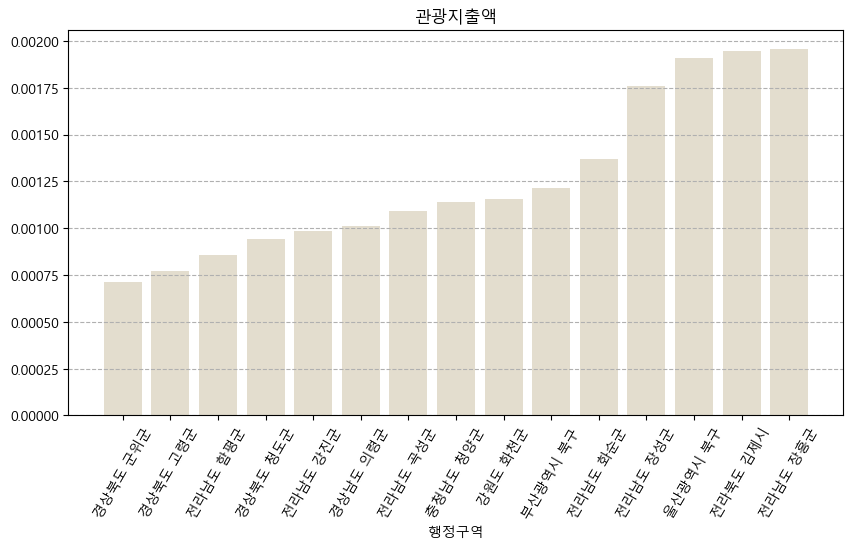

In [70]:
plt.figure(figsize=(10,5))
plt.bar(x=sort_total_money.iloc[:15,0],height=sort_total_money.iloc[:15,3],color='#E3DDCE')
plt.xlabel('행정구역')
plt.title('관광지출액')
plt.grid(axis='y',linestyle='--')
plt.xticks(rotation=60)
plt.show()


---

### 숨은명소 선택 기준 

- (내국인관광방문객수 대비 외국인관광방문객수 순위 , 면적당 관광명소 개수 순위, (내국인관광지출액 대비 외국인관광지출액)의 평균 순위)의 평균

In [71]:
visit=sort_total_visit[['행정구역','외국인/내국인']]
visit

,행정구역,외국인/내국인
0,광주광역시 남구,0.000660
1,강원도 태백시,0.000690
2,광주광역시 북구,0.000737
3,대전광역시 중구,0.000738
4,충청남도 계룡시,0.000744
5,울산광역시 중구,0.000758
6,전라남도 화순군,0.000781
7,충청북도 청주시 상당구,0.000798
8,부산광역시 북구,0.000808
9,충청남도 청양군,0.000838


In [72]:
visit=visit.reset_index()
visit=visit.rename(columns={'index':'visit_rank','외국인/내국인':'(외국인/내국인)방문객수'})
visit

,visit_rank,행정구역,(외국인/내국인)방문객수
0,0,광주광역시 남구,0.000660
1,1,강원도 태백시,0.000690
2,2,광주광역시 북구,0.000737
3,3,대전광역시 중구,0.000738
4,4,충청남도 계룡시,0.000744
5,5,울산광역시 중구,0.000758
6,6,전라남도 화순군,0.000781
7,7,충청북도 청주시 상당구,0.000798
8,8,부산광역시 북구,0.000808
9,9,충청남도 청양군,0.000838


In [73]:
visit['visit_rank']=visit['visit_rank'].astype('int')+1
visit

,visit_rank,행정구역,(외국인/내국인)방문객수
0,1,광주광역시 남구,0.000660
1,2,강원도 태백시,0.000690
2,3,광주광역시 북구,0.000737
3,4,대전광역시 중구,0.000738
4,5,충청남도 계룡시,0.000744
5,6,울산광역시 중구,0.000758
6,7,전라남도 화순군,0.000781
7,8,충청북도 청주시 상당구,0.000798
8,9,부산광역시 북구,0.000808
9,10,충청남도 청양군,0.000838


In [74]:
place=sort_total_place[['행정구역','관광명소/면적']]
place

,행정구역,관광명소/면적
0,부산광역시 중구,2.123306e-06
1,대구광역시 중구,1.417397e-06
2,부산광역시 동구,5.068303e-07
3,부산광역시 영도구,4.225473e-07
4,대구광역시 남구,4.015711e-07
5,부산광역시 수영구,2.937597e-07
6,경상북도 울릉군,2.193518e-07
7,부산광역시 서구,2.145982e-07
8,전라남도 목포시,2.130924e-07
9,울산광역시 동구,1.940419e-07


In [75]:
place=place.reset_index()
place=place.rename(columns={'index':'place_rank'})
place

,place_rank,행정구역,관광명소/면적
0,0,부산광역시 중구,2.123306e-06
1,1,대구광역시 중구,1.417397e-06
2,2,부산광역시 동구,5.068303e-07
3,3,부산광역시 영도구,4.225473e-07
4,4,대구광역시 남구,4.015711e-07
5,5,부산광역시 수영구,2.937597e-07
6,6,경상북도 울릉군,2.193518e-07
7,7,부산광역시 서구,2.145982e-07
8,8,전라남도 목포시,2.130924e-07
9,9,울산광역시 동구,1.940419e-07


In [76]:
place['place_rank']=place['place_rank'].astype('int')+1
place

,place_rank,행정구역,관광명소/면적
0,1,부산광역시 중구,2.123306e-06
1,2,대구광역시 중구,1.417397e-06
2,3,부산광역시 동구,5.068303e-07
3,4,부산광역시 영도구,4.225473e-07
4,5,대구광역시 남구,4.015711e-07
5,6,부산광역시 수영구,2.937597e-07
6,7,경상북도 울릉군,2.193518e-07
7,8,부산광역시 서구,2.145982e-07
8,9,전라남도 목포시,2.130924e-07
9,10,울산광역시 동구,1.940419e-07


In [77]:
money=sort_total_money[['행정구역','평균']]
money

,행정구역,평균
0,경상북도 군위군,0.000714
1,경상북도 고령군,0.000773
2,전라남도 함평군,0.000859
3,경상북도 청도군,0.000942
4,전라남도 강진군,0.000986
5,경상남도 의령군,0.001010
6,전라남도 곡성군,0.001093
7,충청남도 청양군,0.001140
8,강원도 화천군,0.001156
9,부산광역시 북구,0.001212


In [78]:
money=money.reset_index()
money=money.rename(columns={'index':'money_rank','평균':'(외국인/내국인)지출액 평균'})
money

,money_rank,행정구역,(외국인/내국인)지출액 평균
0,0,경상북도 군위군,0.000714
1,1,경상북도 고령군,0.000773
2,2,전라남도 함평군,0.000859
3,3,경상북도 청도군,0.000942
4,4,전라남도 강진군,0.000986
5,5,경상남도 의령군,0.001010
6,6,전라남도 곡성군,0.001093
7,7,충청남도 청양군,0.001140
8,8,강원도 화천군,0.001156
9,9,부산광역시 북구,0.001212


In [79]:
money['money_rank']=money['money_rank'].astype('int')+1
money

,money_rank,행정구역,(외국인/내국인)지출액 평균
0,1,경상북도 군위군,0.000714
1,2,경상북도 고령군,0.000773
2,3,전라남도 함평군,0.000859
3,4,경상북도 청도군,0.000942
4,5,전라남도 강진군,0.000986
5,6,경상남도 의령군,0.001010
6,7,전라남도 곡성군,0.001093
7,8,충청남도 청양군,0.001140
8,9,강원도 화천군,0.001156
9,10,부산광역시 북구,0.001212


In [80]:
code=pd.read_csv('시군구법정동코드.csv')

In [81]:
code=code.drop('Unnamed: 0',axis=1)
code

,코드,행정구역,존재유무,시도,군구
0,11110,서울특별시 종로구,존재,서울특별시,종로구
1,11140,서울특별시 중구,존재,서울특별시,중구
2,11170,서울특별시 용산구,존재,서울특별시,용산구
3,11200,서울특별시 성동구,존재,서울특별시,성동구
4,11215,서울특별시 광진구,존재,서울특별시,광진구
5,11230,서울특별시 동대문구,존재,서울특별시,동대문구
6,11260,서울특별시 중랑구,존재,서울특별시,중랑구
7,11290,서울특별시 성북구,존재,서울특별시,성북구
8,11305,서울특별시 강북구,존재,서울특별시,강북구
9,11320,서울특별시 도봉구,존재,서울특별시,도봉구


In [82]:
code=code[['코드','행정구역']]
code

,코드,행정구역
0,11110,서울특별시 종로구
1,11140,서울특별시 중구
2,11170,서울특별시 용산구
3,11200,서울특별시 성동구
4,11215,서울특별시 광진구
5,11230,서울특별시 동대문구
6,11260,서울특별시 중랑구
7,11290,서울특별시 성북구
8,11305,서울특별시 강북구
9,11320,서울특별시 도봉구


In [83]:
total=pd.merge(visit,place,how='right',on='행정구역')
total

,visit_rank,행정구역,(외국인/내국인)방문객수,place_rank,관광명소/면적
0,169,부산광역시 중구,0.026113,1,2.123306e-06
1,129,대구광역시 중구,0.003250,2,1.417397e-06
2,163,부산광역시 동구,0.015674,3,5.068303e-07
3,165,부산광역시 영도구,0.017455,4,4.225473e-07
4,60,대구광역시 남구,0.001418,5,4.015711e-07
5,136,부산광역시 수영구,0.003651,6,2.937597e-07
6,172,경상북도 울릉군,0.032491,7,2.193518e-07
7,162,부산광역시 서구,0.014173,8,2.145982e-07
8,45,전라남도 목포시,0.001274,9,2.130924e-07
9,155,울산광역시 동구,0.008628,10,1.940419e-07


In [84]:
total.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 173 entries, 0 to 172
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   visit_rank     173 non-null    int32  
 1   행정구역           173 non-null    object 
 2   (외국인/내국인)방문객수  173 non-null    float64
 3   place_rank     173 non-null    int32  
 4   관광명소/면적        173 non-null    float64
dtypes: float64(2), int32(2), object(1)
memory usage: 6.8+ KB


In [85]:
total=pd.merge(total,money,how='right',on='행정구역')
total

,visit_rank,행정구역,(외국인/내국인)방문객수,place_rank,관광명소/면적,money_rank,(외국인/내국인)지출액 평균
0,50,경상북도 군위군,0.001334,171,3.255607e-09,1,0.000714
1,107,경상북도 고령군,0.002342,106,1.562257e-08,2,0.000773
2,39,전라남도 함평군,0.001228,136,1.020140e-08,3,0.000859
3,101,경상북도 청도군,0.002149,158,7.206581e-09,4,0.000942
4,27,전라남도 강진군,0.001060,85,1.996369e-08,5,0.000986
5,28,경상남도 의령군,0.001064,163,6.212327e-09,6,0.001010
6,17,전라남도 곡성군,0.000957,121,1.278616e-08,7,0.001093
7,10,충청남도 청양군,0.000838,135,1.043624e-08,8,0.001140
8,124,강원도 화천군,0.002855,114,1.430250e-08,9,0.001156
9,9,부산광역시 북구,0.000808,40,5.079998e-08,10,0.001212


In [86]:
total.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 173 entries, 0 to 172
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   visit_rank       173 non-null    int32  
 1   행정구역             173 non-null    object 
 2   (외국인/내국인)방문객수    173 non-null    float64
 3   place_rank       173 non-null    int32  
 4   관광명소/면적          173 non-null    float64
 5   money_rank       173 non-null    int32  
 6   (외국인/내국인)지출액 평균  173 non-null    float64
dtypes: float64(3), int32(3), object(1)
memory usage: 8.8+ KB


In [87]:
total=total[['행정구역','visit_rank','place_rank','money_rank','(외국인/내국인)방문객수','관광명소/면적','(외국인/내국인)지출액 평균']]
total

,행정구역,visit_rank,place_rank,money_rank,(외국인/내국인)방문객수,관광명소/면적,(외국인/내국인)지출액 평균
0,경상북도 군위군,50,171,1,0.001334,3.255607e-09,0.000714
1,경상북도 고령군,107,106,2,0.002342,1.562257e-08,0.000773
2,전라남도 함평군,39,136,3,0.001228,1.020140e-08,0.000859
3,경상북도 청도군,101,158,4,0.002149,7.206581e-09,0.000942
4,전라남도 강진군,27,85,5,0.001060,1.996369e-08,0.000986
5,경상남도 의령군,28,163,6,0.001064,6.212327e-09,0.001010
6,전라남도 곡성군,17,121,7,0.000957,1.278616e-08,0.001093
7,충청남도 청양군,10,135,8,0.000838,1.043624e-08,0.001140
8,강원도 화천군,124,114,9,0.002855,1.430250e-08,0.001156
9,부산광역시 북구,9,40,10,0.000808,5.079998e-08,0.001212


In [88]:
total['순위평균']=(total['visit_rank']+total['place_rank']+total['money_rank'])/3

In [89]:
total

,행정구역,visit_rank,place_rank,money_rank,(외국인/내국인)방문객수,관광명소/면적,(외국인/내국인)지출액 평균,순위평균
0,경상북도 군위군,50,171,1,0.001334,3.255607e-09,0.000714,74.000000
1,경상북도 고령군,107,106,2,0.002342,1.562257e-08,0.000773,71.666667
2,전라남도 함평군,39,136,3,0.001228,1.020140e-08,0.000859,59.333333
3,경상북도 청도군,101,158,4,0.002149,7.206581e-09,0.000942,87.666667
4,전라남도 강진군,27,85,5,0.001060,1.996369e-08,0.000986,39.000000
5,경상남도 의령군,28,163,6,0.001064,6.212327e-09,0.001010,65.666667
6,전라남도 곡성군,17,121,7,0.000957,1.278616e-08,0.001093,48.333333
7,충청남도 청양군,10,135,8,0.000838,1.043624e-08,0.001140,51.000000
8,강원도 화천군,124,114,9,0.002855,1.430250e-08,0.001156,82.333333
9,부산광역시 북구,9,40,10,0.000808,5.079998e-08,0.001212,19.666667


In [90]:
sort_total=total.sort_values('순위평균')

In [91]:
sort_total=sort_total.reset_index(drop=True)
sort_total

,행정구역,visit_rank,place_rank,money_rank,(외국인/내국인)방문객수,관광명소/면적,(외국인/내국인)지출액 평균,순위평균
0,부산광역시 북구,9,40,10,0.000808,5.079998e-08,0.001212,19.666667
1,대구광역시 서구,24,12,24,0.001029,1.730790e-07,0.002378,20.000000
2,광주광역시 남구,1,33,34,0.000660,6.555417e-08,0.002993,22.666667
3,광주광역시 북구,3,26,62,0.000737,9.145292e-08,0.004137,30.333333
4,전라남도 장흥군,15,63,15,0.000948,2.892300e-08,0.001958,31.000000
5,울산광역시 중구,6,14,78,0.000758,1.621161e-07,0.005472,32.666667
6,대전광역시 중구,4,29,77,0.000738,8.041276e-08,0.005421,36.666667
7,전라남도 화순군,7,95,11,0.000781,1.778881e-08,0.001372,37.666667
8,대전광역시 대덕구,20,30,66,0.000969,7.276640e-08,0.004429,38.666667
9,전라남도 강진군,27,85,5,0.001060,1.996369e-08,0.000986,39.000000


In [92]:
sort_total[['행정구역','순위평균']].head(10)

,행정구역,순위평균
0,부산광역시 북구,19.666667
1,대구광역시 서구,20.000000
2,광주광역시 남구,22.666667
3,광주광역시 북구,30.333333
4,전라남도 장흥군,31.000000
5,울산광역시 중구,32.666667
6,대전광역시 중구,36.666667
7,전라남도 화순군,37.666667
8,대전광역시 대덕구,38.666667
9,전라남도 강진군,39.000000


In [93]:
code_sort_total=pd.merge(sort_total,code,how='left',on='행정구역')
code_sort_total

,행정구역,visit_rank,place_rank,money_rank,(외국인/내국인)방문객수,관광명소/면적,(외국인/내국인)지출액 평균,순위평균,코드
0,부산광역시 북구,9,40,10,0.000808,5.079998e-08,0.001212,19.666667,26320
1,대구광역시 서구,24,12,24,0.001029,1.730790e-07,0.002378,20.000000,27170
2,광주광역시 남구,1,33,34,0.000660,6.555417e-08,0.002993,22.666667,29155
3,광주광역시 북구,3,26,62,0.000737,9.145292e-08,0.004137,30.333333,29170
4,전라남도 장흥군,15,63,15,0.000948,2.892300e-08,0.001958,31.000000,46800
5,울산광역시 중구,6,14,78,0.000758,1.621161e-07,0.005472,32.666667,31110
6,대전광역시 중구,4,29,77,0.000738,8.041276e-08,0.005421,36.666667,30140
7,전라남도 화순군,7,95,11,0.000781,1.778881e-08,0.001372,37.666667,46790
8,대전광역시 대덕구,20,30,66,0.000969,7.276640e-08,0.004429,38.666667,30230
9,전라남도 강진군,27,85,5,0.001060,1.996369e-08,0.000986,39.000000,46810


In [94]:
with open('TL_SCCO_SIG.json',encoding='utf-8') as f:
    geo=json.loads(f.read())

In [95]:
geo

{'type': 'FeatureCollection',
 'bbox': [124.7893154389517,
  33.17261058239259,
  130.96325546758288,
  38.54261253850525],
 'features': [{'type': 'Feature',
   'geometry': {'type': 'Polygon',
    'coordinates': [[[127.60472638427933, 38.072648233869785],
      [127.60776133059719, 38.071674018579536],
      [127.65473867484185, 38.02576695898344],
      [127.65490464895771, 38.0272843475771],
      [127.73374753570245, 38.035814428263734],
      [127.73394342807514, 38.03607616237089],
      [127.77599099169834, 38.01389743776739],
      [127.77653868086756, 38.013597091144185],
      [127.77680464554413, 38.013645455050394],
      [127.77680679204794, 38.01364599945677],
      [127.77821827512304, 38.01390161291351],
      [127.78820556176866, 37.99429384493769],
      [127.85810008725723, 38.018823189046856],
      [127.84998445340655, 38.03881738462732],
      [127.84996624162804, 38.03970714676426],
      [127.85341448275034, 38.05051795468947],
      [127.85515517661896, 38.05230

In [96]:
m=folium.Map(location=[36.5, 127.5],
            zoom_start=7)
folium.GeoJson(geo).add_to(m)
m

In [97]:
folium.Choropleth(geo_data=geo,
                  data=code_sort_total,
                  columns=['코드','순위평균'],
                  fill_color='YlGn', fill_opacity=0.8,
                  line_opacity=0.3,
                  key_on='feature.properties.SIG_CD',
                 ).add_to(m)
m